In [127]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import folium
from folium.plugins import MarkerCluster, MousePosition
from folium.features import DivIcon 
from geopy.geocoders import Nominatim

# Function to show data quality of each column
def summary(dtf):
    sumary=pd.concat([dtf.isna().sum(),((dtf == 0).sum())/dtf.shape[0],dtf.dtypes], axis=1)
    sumary=sumary.rename(columns={sumary.columns[0]: 'NaN'})
    sumary=sumary.rename(columns={sumary.columns[1]: 'Zeros'})
    sumary=sumary.rename(columns={sumary.columns[2]: 'Type'})
    sumary['NaN']=sumary['NaN'].astype(str)+' ('+((sumary['NaN']*100/dtf.shape[0]).astype(int)).astype(str)+'%)'
    sumary['Zeros']=(sumary['Zeros']*100).astype(int)
    sumary['Zeros']=(dtf == 0).sum().astype(str)+' ('+sumary['Zeros'].astype(str)+'%)'
    sumary=sumary[['Type','NaN','Zeros']]
    return print(sumary)

In [128]:
df=pd.read_csv("C:/Users/limju/Downloads/uber.csv")
summary(df)
df.head()

                      Type     NaN      Zeros
Unnamed: 0           int64  0 (0%)     0 (0%)
key                 object  0 (0%)     0 (0%)
fare_amount        float64  0 (0%)     5 (0%)
pickup_datetime     object  0 (0%)     0 (0%)
pickup_longitude   float64  0 (0%)  3786 (1%)
pickup_latitude    float64  0 (0%)  3782 (1%)
dropoff_longitude  float64  1 (0%)  3764 (1%)
dropoff_latitude   float64  1 (0%)  3758 (1%)
passenger_count      int64  0 (0%)   709 (0%)


,Unnamed: 0,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,2015-05-07 19:52:06.0000003,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,27835199,2009-07-17 20:04:56.0000002,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,44984355,2009-08-24 21:45:00.00000061,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1
3,25894730,2009-06-26 08:22:21.0000001,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3
4,17610152,2014-08-28 17:47:00.000000188,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5


There are about 3.7k entries which the pickup and dropoff locations are unknown, but fortunately they only occupy 1% of the whole dataset. These entries will not be considered in our model and will be dropped.

**Note:**  all invalid entries in this dataset will be **dropped without further consideration** to exclude any kind of bias, this is a generally acceptable approach for massive datasets.

In [129]:
df=df[df['pickup_longitude']!=0]
df=df[df['pickup_latitude']!=0]
df=df[df['dropoff_longitude']!=0]
df=df[df['dropoff_latitude']!=0]
df=df[df['passenger_count']!=0]
df=df[df['fare_amount']!=0]
df.reset_index(inplace=True)
df.drop(['index','key'], axis=1, inplace=True)
df.rename(columns={"Unnamed: 0": "trip"}, inplace=True)

summary(df)

                      Type     NaN   Zeros
trip                 int64  0 (0%)  0 (0%)
fare_amount        float64  0 (0%)  0 (0%)
pickup_datetime     object  0 (0%)  0 (0%)
pickup_longitude   float64  0 (0%)  0 (0%)
pickup_latitude    float64  0 (0%)  0 (0%)
dropoff_longitude  float64  0 (0%)  0 (0%)
dropoff_latitude   float64  0 (0%)  0 (0%)
passenger_count      int64  0 (0%)  0 (0%)


In [130]:
df.head()

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
0,24238194,7.5,2015-05-07 19:52:06 UTC,-73.999817,40.738354,-73.999512,40.723217,1
1,27835199,7.7,2009-07-17 20:04:56 UTC,-73.994355,40.728225,-73.994710,40.750325,1
2,44984355,12.9,2009-08-24 21:45:00 UTC,-74.005043,40.740770,-73.962565,40.772647,1
3,25894730,5.3,2009-06-26 08:22:21 UTC,-73.976124,40.790844,-73.965316,40.803349,3
4,17610152,16.0,2014-08-28 17:47:00 UTC,-73.925023,40.744085,-73.973082,40.761247,5


# Pickup Locations - First Glance
The trips in dataset are concentrated in the island of New York, with a few pickups extending to Long Island particularly at JFK and LGA Airport.

Due to the size of the dataset, we will generate only 5000 random samples to compensate for the loading time.

In [131]:
mymap = folium.Map(location=[40.6970193,-74.3093268], zoom_start=4)
marker_cluster = MarkerCluster(name='Pickups')
marker_cluster2 = MarkerCluster(name='Dropoffs')
marker_cluster.add_to(mymap)
marker_cluster2.add_to(mymap)
for index, row in df.sample(n=5000, random_state=4).iterrows():
    lb1, lb2 = row['trip'], row['fare_amount']
    folium.Marker(location=[row['pickup_latitude'], row['pickup_longitude']], icon=folium.Icon(color='blue'), popup=row['trip']).add_to(marker_cluster)
    folium.Marker(location=[row['dropoff_latitude'], row['dropoff_longitude']], icon=folium.Icon(color='red'), popup=row['trip']).add_to(marker_cluster2)
folium.LayerControl(collapsed=False).add_to(mymap)

formatter = "function(num) {return L.Util.formatNum(num, 5);};"
mouse_position = MousePosition(
    position='topright',
    separator=' Long: ',
    empty_string='NaN',
    lng_first=False,
    num_digits=20,
    prefix='Lat:',
    lat_formatter=formatter,
    lng_formatter=formatter,
)

mymap.add_child(mouse_position)
display(mymap)

# Data Preprocessing
I just can't deny that the data cleansing part of this dataset is a pain in the bottoms!

Forgive my language, here are some of the major data quality issues:

### 1. Invalid Coordinates
Since each coordinate can only fall in this range:
* Latitude: -90 to 90
* Longitude: -180 to 180

Any coordinate which falls outside of this range are 100% invalid, let's see if we have any:

In [132]:
df[(abs(df['pickup_latitude'])>90)|(abs(df['dropoff_latitude'])>90)|(abs(df['dropoff_longitude'])>180)|(abs(df['pickup_longitude'])>180)].head(5)

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
4852,42931506,4.9,2012-04-28 00:58:00 UTC,-748.016667,40.739957,-74.003570,40.734192,1
31806,5634081,15.7,2012-06-16 10:04:00 UTC,-74.016055,40.715155,-737.916665,40.697862,2
47421,1055960,33.7,2011-11-05 23:26:00 UTC,-735.200000,40.770092,-73.980187,40.765530,1
55313,14257861,8.1,2012-03-11 07:24:00 UTC,-73.960828,404.433332,-73.988357,40.769037,1
60372,2849369,8.5,2012-06-13 05:45:00 UTC,-73.951385,401.066667,-73.982110,40.754117,1


We can see there are longitudes reaching ±730 or latitudes reaching 400, this is most probably a error in decimals. We can treat them with a simple division by 10.

However, for trip 33249845 & 23566642, these coordinates just do not seem to fit in, we will remove them from our analysis.

In [12]:
# df1=df1[df1['pickup_latitude']<1000]
# df1['pickup_longitude'][df1['pickup_longitude']<-700]=df1['pickup_longitude']/10
# df1['dropoff_longitude'][df1['dropoff_longitude']<-700]=df1['dropoff_longitude']/10
# df1['pickup_latitude'][df1['pickup_latitude']>400]=df1['pickup_latitude']/10
# df1['dropoff_latitude'][df1['dropoff_latitude']>400]=df1['dropoff_latitude']/10

### 2. Swapped Latitude & Longitude values
The map also tells us that some passengers were in ANTARTICA, I didn't even knew Uber covered the South Pole!

In [133]:
df[(df['pickup_latitude']<-70) | (df['dropoff_latitude']<-70)].head()

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
2441,6452891,6.0,2013-05-22 10:54:00 UTC,40.746760,-73.982127,40.757287,-73.974800,1
4287,44648183,12.5,2013-05-24 00:43:00 UTC,40.751797,-73.970777,40.719787,-73.992137,6
4335,3826665,9.5,2013-05-25 01:16:00 UTC,40.732897,-73.997740,40.747532,-73.972540,1
4653,52635142,6.5,2013-05-22 12:38:00 UTC,40.770667,-73.961957,40.761672,-73.967237,1
7219,45851743,10.5,2013-05-23 00:29:00 UTC,40.714897,-74.009697,40.726197,-73.994370,2


Jokes aside, these records seemed to just have their latitude and longitude confused, we will swap the lats and longs for these entries and they should point towards the great NYC again.

In [14]:
# df1.loc[df1['pickup_latitude'] < -70, ['pickup_latitude', 'pickup_longitude']] = df1.loc[df1['pickup_latitude'] < -70, ['pickup_longitude', 'pickup_latitude']].values
# df1.loc[df1['dropoff_latitude'] < -70, ['dropoff_latitude', 'dropoff_longitude']] = df1.loc[df1['dropoff_latitude'] < -70, ['dropoff_longitude', 'dropoff_latitude']].values

### 3. Intercontinential Travel
There are also trips which spans across continents (big difference in pickup & dropoff longitudes), and it all takes less than $30, what a bang for a buck! 

In [134]:
df[abs(df['pickup_longitude']-df['dropoff_longitude'])>40].head()

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
1900,915515,7.0,2013-02-10 16:18:00 UTC,-0.131667,40.757063,-73.991593,40.749953,1
2118,7976070,5.7,2012-07-21 12:16:00 UTC,-1.216667,40.748597,-74.004822,40.734670,1
4852,42931506,4.9,2012-04-28 00:58:00 UTC,-748.016667,40.739957,-74.003570,40.734192,1
6468,32571365,9.3,2012-06-05 19:05:00 UTC,-1.866667,40.765987,-73.972280,40.793807,1
11631,16955954,14.9,2012-02-26 00:01:00 UTC,-0.007712,40.725602,-73.967487,40.766410,5


Nope, we will drop these too because I don't think Uber covered for flights, and flying cars have not being invented yet.

In [16]:
# df1=df1[abs(df1['pickup_longitude']-df1['dropoff_longitude'])<40]

### 4. Trips in the OCEAN !
#### a) African Ocean
There were a few lats and longs near 0, which points towards the MIDDLE of the ocean just below Ghana.



In [135]:
df[(abs(df['pickup_longitude'])<1) | (abs(df['dropoff_longitude'])<1)].head()

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
163,17269533,14.5,2010-07-14 17:38:00 UTC,0.001782,0.007380,0.000875,0.005670,1
1900,915515,7.0,2013-02-10 16:18:00 UTC,-0.131667,40.757063,-73.991593,40.749953,1
11631,16955954,14.9,2012-02-26 00:01:00 UTC,-0.007712,40.725602,-73.967487,40.766410,5
22602,10365124,10.9,2010-10-09 22:53:00 UTC,-0.076468,0.087237,-0.079742,0.097257,1
35835,24351230,11.7,2010-06-12 11:55:00 UTC,0.013518,0.001857,0.010920,0.010308,1


In [18]:
# df1=df1[abs(df1['pickup_longitude'])>1]

#### b) New York Offshore
Looking back at NYC, there are also a bunch of offshore pickups/dropoffs near NYC.

In [136]:
df[((df['pickup_latitude']<40.52) & (df['pickup_longitude']>-73.96)) | ((df['dropoff_latitude']<40.52) & (df['dropoff_longitude']>-73.96))].head()

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
163,17269533,14.5,2010-07-14 17:38:00 UTC,0.001782,0.007380,0.000875,0.005670,1
1862,6368561,5.0,2012-10-19 20:24:00 UTC,-73.733760,40.221474,-73.737622,40.223950,1
2441,6452891,6.0,2013-05-22 10:54:00 UTC,40.746760,-73.982127,40.757287,-73.974800,1
2613,53340226,6.9,2011-06-03 00:03:00 UTC,-73.902908,40.428030,-73.931997,40.422658,1
3064,12380843,11.0,2012-11-07 16:30:52 UTC,-73.504116,40.239864,-73.497312,40.239697,1


Since it is hard to work out the actual coordinates, we'll just drop em!

In [20]:
# df1=df1[~(((df1['pickup_latitude']<40.52) & (df1['pickup_longitude']>-73.96)) | ((df1['dropoff_latitude']<40.52) & (df1['dropoff_longitude']>-73.96)))]

### 5. Same Pickup & Dropoff Locations
Seriously, why am I paying if your car didn't even budge? And surprisingly there were 2,042 of such trips!

In [137]:
df[(df['pickup_latitude'] == df['dropoff_latitude']) & (df['dropoff_longitude'] == df['pickup_longitude'])].head()

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count
5,44470845,4.90,2011-02-12 02:27:09 UTC,-73.969019,40.755910,-73.969019,40.755910,1
46,22405517,56.80,2013-01-03 22:24:41 UTC,-73.993498,40.764686,-73.993498,40.764686,1
81,25485719,49.57,2009-08-07 10:43:07 UTC,-73.975058,40.788820,-73.975058,40.788820,1
160,54642873,4.50,2014-01-22 21:01:18 UTC,-73.992937,40.757780,-73.992937,40.757780,1
351,11876316,10.10,2009-08-24 17:25:00 UTC,-73.928705,40.753475,-73.928705,40.753475,1


That's not how Capitalism works, let's drop it.

In [23]:
# df1=df1[(df1['pickup_longitude']!= df1['dropoff_longitude']) | (df1['pickup_latitude']!= df1['dropoff_latitude'])]

In [138]:
df=df[abs(df['pickup_latitude'])<=90]
df=df[abs(df['dropoff_latitude'])<=90]
df=df[abs(df['pickup_longitude'])<=180]
df=df[abs(df['dropoff_longitude'])<=180]
df=df[(df['pickup_longitude']<-73.5) | (df['dropoff_longitude']<-73.5)]
df=df[abs(df['pickup_longitude']-df['dropoff_longitude'])<40]
df=df[abs(df['pickup_longitude'])>1]
df=df[~(((df['pickup_latitude']<40.52) & (df['pickup_longitude']>-73.96)) | ((df['dropoff_latitude']<40.52) & (df['dropoff_longitude']>-73.96)))]
df=df[(df['pickup_longitude']!= df['dropoff_longitude']) | (df['pickup_latitude']!= df['dropoff_latitude'])]

## Trip Distance Calculation
*Note: Although there are many APIs out there to calculate the driving distance between 2 points, they are usually paid services and performing requests on each row of this massive dataset is too time consuming, so we will use **Haversine distance** here.*

In [139]:
def hvs(lat1, lon1, lat2, lon2):
    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = np.radians([lat1, lon1, lat2, lon2])
    d_lat = lat2 - lat1
    d_lon = lon2 - lon1
    a = np.sin(d_lat/2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(d_lon/2) ** 2
    distance = 6371* 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return distance

df['distance'] = df.apply(lambda row: hvs(row['pickup_latitude'], row['pickup_longitude'], row['dropoff_latitude'], row['dropoff_longitude']), axis=1)

In [140]:
df['distance'].head()

0    1.683323
1    2.457590
2    5.036377
3    1.661683
4    4.475450
Name: distance, dtype: float64

## Date & Time Feature Extraction
The pickup date & time could tell us a lot more on the fare evolution such as the following:
* Year-to-Year comparison to observe if there is a price hike due to inflation
* Day of week comparison to visualize if there are significant difference in fares on weekdays and weekends.
* Hourly comparison to see if there are any significant price hikes during peak hours.

**NOTE**: Although this is based in New York, the *pickup_datetime* column is showing times in the UTC timezone instead of the usual EST/EDT timezone for New York (UTC-4/-5). It makes more sense to convert it to local time:

In [141]:
df.reset_index(inplace=True)
df.drop(['index'], axis=1, inplace=True)
df['pickup_datetime']=pd.to_datetime(df['pickup_datetime'])
df['pickup_datetime']=df['pickup_datetime'].dt.tz_convert('America/New_York')
df['Date'] = df['pickup_datetime'].dt.date
df['Time'] = df['pickup_datetime'].dt.strftime('%H:%M')
df['Year'] = df['pickup_datetime'].dt.year
df['Month'] = df['pickup_datetime'].dt.month
df['Day'] = df['pickup_datetime'].dt.day
df['WeekDay'] = df['pickup_datetime'].dt.weekday
df['Hour'] = df['pickup_datetime'].dt.hour
df['Hour'] = df['Hour']-1
df['Hour'] = df['Hour'].replace(-1,23)
df.head()

,trip,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,distance,Date,Time,Year,Month,Day,WeekDay,Hour
0,24238194,7.5,2015-05-07 15:52:06-04:00,-73.999817,40.738354,-73.999512,40.723217,1,1.683323,2015-05-07,15:52,2015,5,7,3,14
1,27835199,7.7,2009-07-17 16:04:56-04:00,-73.994355,40.728225,-73.994710,40.750325,1,2.457590,2009-07-17,16:04,2009,7,17,4,15
2,44984355,12.9,2009-08-24 17:45:00-04:00,-74.005043,40.740770,-73.962565,40.772647,1,5.036377,2009-08-24,17:45,2009,8,24,0,16
3,25894730,5.3,2009-06-26 04:22:21-04:00,-73.976124,40.790844,-73.965316,40.803349,3,1.661683,2009-06-26,04:22,2009,6,26,4,3
4,17610152,16.0,2014-08-28 13:47:00-04:00,-73.925023,40.744085,-73.973082,40.761247,5,4.475450,2014-08-28,13:47,2014,8,28,3,12


In [ ]:
# geolocator = Nominatim(user_agent="uber locations")
# #location=geolocator.reverse((40.738354,-73.999817))
# #address = location.raw['address']['postcode']
# #address

# def pickup_geocode(row):
#     try:
#         location = geolocator.reverse((row['pickup_latitude'], row['pickup_longitude']), exactly_one=True)
#         address = location.raw['address']
#         suburb = address.get('postcode', '')
#         row['P_postcode'] = postcode
#         return row
#     except Exception as e:
#         return "Error: " + str(e) 
    
# def dropoff_geocode(row):
#     try:
#         location = geolocator.reverse((row['dropoff_latitude'], row['dropoff_longitude']), exactly_one=True)
#         address = location.raw['address']
#         suburb = address.get('postcode', '')
#         row['D_postcode'] = postcode
#         return row
#     except Exception as e:
#         return "Error: " + str(e) 

    
# df2=df1.sample(n=2000, random_state=123)
# df2 = df2.apply(pickup_geocode, axis=1)
# df2 = df2.apply(dropoff_geocode, axis=1)

# EDA
After extracting the relevant date and time components, we can proceed to explore the data and answer our initial questions.

### Univariate Analysis
Notice that we haven't touch on the numerical features in our analysis, let's visualize the *fare_amount* and *passenger_count* to detect any abnormalities.

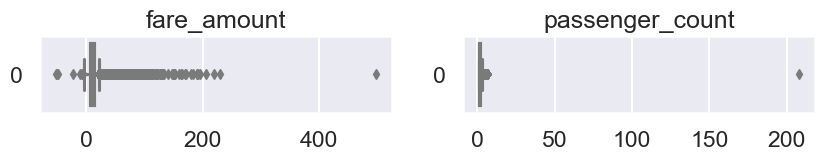

In [142]:
sns.set_palette('pastel')
sns.set_style('darkgrid')
fig, axs = plt.subplots(1, 2, figsize=(10, 1))
sns.boxplot(data=df['fare_amount'],orient='h', ax=axs[0]).set(title='fare_amount')
sns.boxplot(data=df['passenger_count'], orient='h', ax=axs[1]).set(title='passenger_count')
plt.show()

The presence of an extreme outlier in both (fare_amount reaching $500 and passenger_count above 200) has made it difficult to visualize the quartiles, we should remove it as it occurred only once in this massive dataset but could potentially impact our model performance later.

Also, notice that there are fare_amount below 0 which shouldn't be the case here? They will be dropped too.

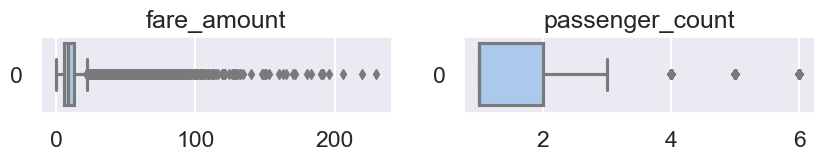

In [143]:
df=df[(df['fare_amount']<400) & (df['fare_amount']>0)]
df=df[df['passenger_count']<150]
fig, axs = plt.subplots(1, 2, figsize=(10, 1))
sns.boxplot(data=df['fare_amount'],orient='h', ax=axs[0]).set(title='fare_amount')
sns.boxplot(data=df['passenger_count'], orient='h', ax=axs[1]).set(title='passenger_count')

plt.show()

Now we are able to observe the distributions with clarity.
Obviously the passenger_count is positively skewed with most of the trips carrying only 1 passenger.
further transformations are still required but we will do it towards the end of the EDA.

## Bivariate Analysis - Fares & Passengers
Now it's time to visualize their interaction with each other:

AxesSubplot(0.125,0.11;0.775x0.77)


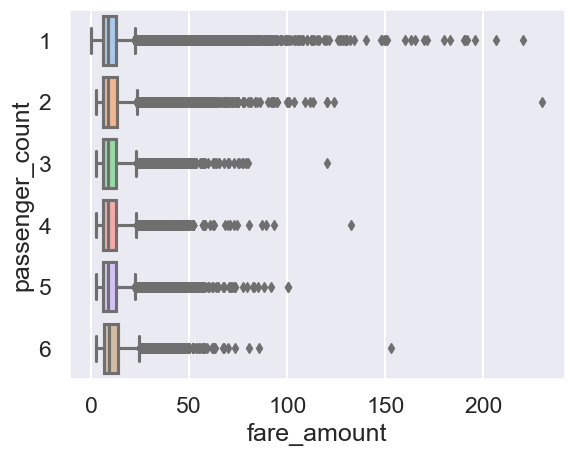

In [144]:
print(sns.boxplot(data=df, y='passenger_count', x='fare_amount', orient='h'))

Although at first glance it seems that fares for 1 passenger are higher, but if we look closely, they are all outliers and in fact, they all have the same quartiles.

It may be hard to visualize with all the outliers present, let's drop them now:

<AxesSubplot:xlabel='fare_amount', ylabel='passenger_count'>

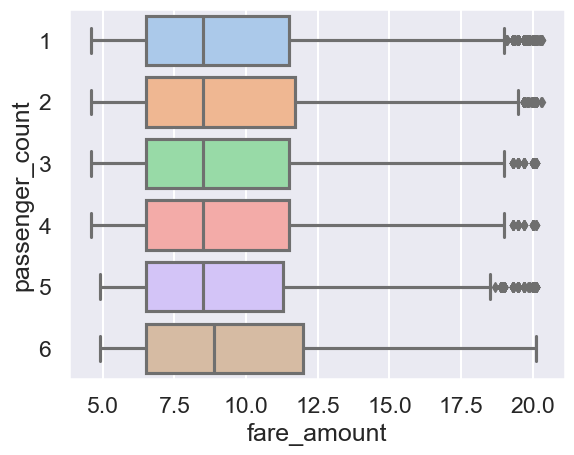

In [145]:
percentiles = df['fare_amount'].quantile([0.1, 0.9]).values
df=df[(df['fare_amount'] > percentiles[0]) & (df['fare_amount'] < percentiles[1])]
sns.boxplot(data=df[df['fare_amount']<30], y='passenger_count', x='fare_amount', orient='h')

In [146]:
df.groupby('passenger_count')['fare_amount'].describe()

,count,mean,std,min,25%,50%,75%,max
passenger_count,,,,,,,,
1,106089.0,9.373133,3.667357,4.6,6.5,8.5,11.5,20.33
2,22660.0,9.479730,3.679586,4.6,6.5,8.5,11.7,20.33
3,6965.0,9.407721,3.634880,4.6,6.5,8.5,11.5,20.10
4,3362.0,9.431276,3.662609,4.6,6.5,8.5,11.5,20.10
5,10763.0,9.344384,3.633100,4.9,6.5,8.5,11.3,20.10
6,3353.0,9.718649,3.768820,4.9,6.5,8.9,12.0,20.10


As observed, the quartiles for most passenger_count are roughly the same, except for passenger_count of 6 which has a higher median and upper quartile than the rest.

In short, passenger_count **does not affect** fare_amount.

### Hourly Comparison
* Fares are exceptionally higher past midnight from 12am to 2am, probably due to lesser drivers available.
* In the daytime, fares do not differ much in gereral from 5am to 4pm, but a steep increase is observed after 4pm until midnight.
* No. of passengers does not seem to have any effect on fares charged.

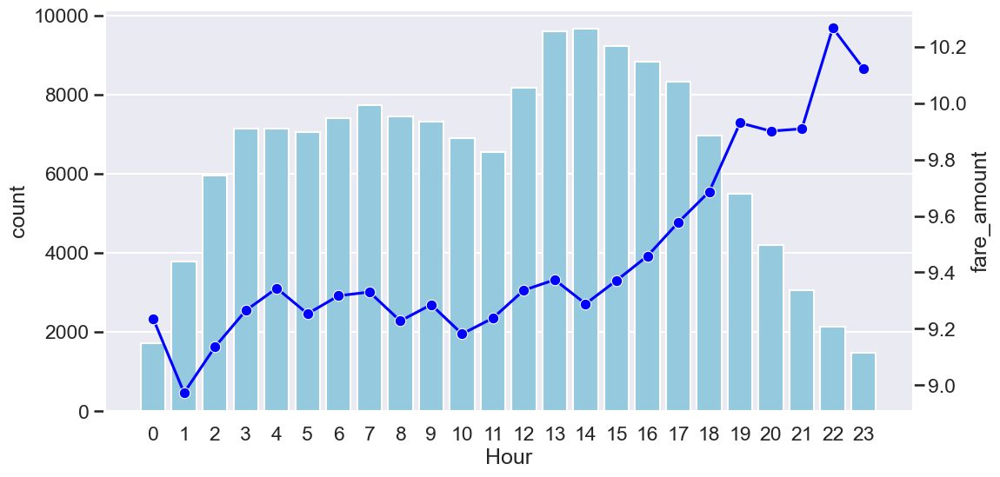

In [148]:
fig, ax1=plt.subplots(figsize=(12,6))
#sns.barplot(data=df,x='Hour', y='passenger_count', color='skyblue', ax=ax1)
sns.countplot(x='Hour',data=df, color='skyblue', ax=ax1)
ax2 = ax1.twinx()
sns.lineplot(data=df,x='Hour', y='fare_amount', ci=None, color='blue', marker='o', ax=ax2)
ax2.grid(False)
plt.show()

### Day of Week Comparison
* Fares are the lowest on Mondays (Weekday=0), and highest on Fridays (Weekday=4). Since the Hourly chart tells us that fares are generally higher in the evening, this could mean **demand for Uber drivers are higher on Friday nights** (TGIF, it's time to party!)
* Passengers per trip are higher on the weekend but still, it does not seem to affect fare_amount in any way.

In [ ]:
fig, ax1=plt.subplots(figsize=(12,6))
sns.color_palette("pastel")
sns.barplot(data=df1,x='WeekDay', y='passenger_count', color='skyblue', ax=ax1)
ax2 = ax1.twinx()
sns.lineplot(data=df1,x='WeekDay', y='fare_amount', errorbar=None, color='blue', marker='o', ax=ax2)
plt.show()

### Yearly comparison of fares
Fares have been increasing slightly since it's official launch in 2009, and it is much more obvious starting from Year 2012 which proves our inflation assumption. 

Although fares are also much higher at first in 2008, this is possibly the pre-launch trial period before further price adjustments brought it down in 2009.

In [ ]:
sns.boxplot(data=df1, x='Year', y='fare_amount')

In [ ]:
import optuna
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Ridge
from sklearn.svm import LinearSVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, KFold, cross_val_score

df1=df1[['passenger_count','distance','Year','WeekDay','Hour','fare_amount']]

df_train, df_test = train_test_split(df1, test_size=0.2)
y_train=df_train['fare_amount']
x_train=df_train.drop(['fare_amount'],axis=1)
y_test=df_test['fare_amount']
x_test=df_test.drop(['fare_amount'],axis=1)

In [ ]:
df_train.head()

In [ ]:
def objective(trial):
    criterion = trial.suggest_categorical('criterion', ['squared_error', 'friedman_mse','absolute_error', 'poisson'])
    splitter = trial.suggest_categorical('splitter', ['best','random'])
    max_depth = trial.suggest_int('max_depth', 3, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 3, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 20)
    max_features = trial.suggest_categorical('max_features', ['sqrt','log2'])
    model = DecisionTreeRegressor(criterion=criterion, splitter=splitter, max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf, max_features=max_features)
    k_folds = KFold(n_splits = 5)
    scores = cross_val_score(model, x_train,y_train, cv = k_folds, scoring='r2').mean()
    return scores

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)
params=study.best_params